# Separation of drums from music signals


Project Contributors:
Manasi Dalal (150166535)
Gaurang Sharma (150165798)

# Overview of the problem and solution 

The separation of drums (percussive components) from music signals is the challenge to be solved. To tackle this problem, we find anisotropy in the percussive and harmonic components. On the spectrogram, the harmonic component has a steady pitch and creates parallel ridges with smooth temporal envelopes, but the energy of a percussive tone is concentrated in a short time frame, forming a vertical ridge with a broad spectral envelope [1]. The spectrogram below explains this anisotropy. The horizontal lines represent the harmonic components, while the vertical lines represent the percussive components.

In other words, harmonic components have temporal continuity along time (thus the horizontal line on the spectrogram), whereas percussive components have temporal continuity along frequency. In order to make use of this discovery, we try to find spectrograms that maximize anisotropy. To maximum efficiency, this can be done iteratively. The algorithm is based on the referenced research article.


# Algorithm implementation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy.signal import hann, hamming, spectrogram
import scipy
from scipy.io import wavfile
from numpy.fft import fft, ifft, fftshift
import librosa as lb
from librosa import display as dp
from IPython.display  import Audio



In [ ]:
def HnP_Cal(hh,ii,W,H,P):
    Hh = H
    Ph = P
    for k in range(EpochNo):
      #print(k)
      term1 = np.zeros_like(Hh)
      term2 = np.zeros_like(Ph)

      for i in range(ii-1):
        term1[:, i] = alpha * (Hh[:, i-1] + Hh[:, i+1] - (2 * Hh[:, i]))

      for h in range(hh-1):
        term2[h, :] = (1 - alpha) * (Ph[h-1, :] + Ph[h+1, :] - (2 * Ph[h, :]))

      d = (term1-term2)/4

      Hh = np.minimum(np.maximum(Hh + d, 0), W)
      Ph = W - Hh

    for h in range(hh):
      for i in range(ii):
        if Hh[h,i]<Ph[h,i]:
          H[h,i] = 0
          P[h,i] = W[h,i]
        if Hh[h,i]>=Ph[h,i]:
          H[h,i] = W[h,i]
          P[h,i] = 0
    return H,P


In [ ]:
def spectograms_plots(file):
    #dp.specshow(20*np.log10(W), y_axis='linear',cmap='gray')
    #plt.title('Power spectrogram of '+file)
    #plt.show()
    
    if file=='police03short.wav':
        cmapColour='rainbow'
    else:
         cmapColour='gist_earth'
    dp.specshow(20*np.log10(W), y_axis='linear',cmap=cmapColour)
    plt.title('Power spectrogram of '+file)
    plt.show()
    dp.specshow(20*np.log10(H), y_axis='linear',cmap=cmapColour)
    #plt.colorbar(format='%+2.0f dB')
    plt.title('Power spectrogram of harmonics from '+file)
    plt.show()
    dp.specshow(20*np.log10(P), y_axis='linear',cmap=cmapColour)
    #plt.colorbar(format='%+2.0f dB')
    plt.title('Power spectrogram of percussions from '+file)
    plt.show()


In [ ]:
def ISTFT_cal():
    Hf = np.power(H,(1/(2*gamma)))* np.exp(1j * np.angle(F))
    Pf = np.power(P,(1/(2*gamma)))* np.exp(1j * np.angle(F))
    ht = lb.istft(Hf, hop_length=int(winlength/2), win_length=winlength, window='hann', center=True, dtype=None, length=None)
    pt = lb.istft(Pf, hop_length=int(winlength/2), win_length=winlength, window='hann', center=True, dtype=None, length=None)
    
    return ht,pt

    
def SNR_cal(ht,pt):
    y = ht+pt
    eh = audio[0:ht.shape[0]]-ht
    ph = audio[0:pt.shape[0]]-pt
    e = audio[:y.shape[0]]-y[:]
    sp = np.sum(np.power(audio,2))
    ehp = np.sum(np.power(eh,2))
    epp = np.sum(np.power(ph,2))
    ep = np.sum(np.power(e,2))

    SNRh = 10*np.log10(sp/ehp)
    SNRp = 10*np.log10(sp/epp)
    SNR = 10*np.log10(sp/ep)
    return e,SNRh,SNRp,SNR,y,ht,pt


In [ ]:
def evaluation_params(e,SNRh,SNRp,SNR):
    print('Gamma:',gamma)
    print('Aplha:',alpha)
    print('SNR of harmonic component:',SNRh)
    print('SNR of percussive component:',SNRp)
    print('SNR:',SNR)
    print('')

    sumelog = np.abs(np.sum(e))
    sumalog = np.abs(np.sum(audio))
    #Accuracy Calculation
    # By deviding the sum of error and sum of original signal
    print('Accuracy:',100-((sumelog/sumalog)*100))
    

Gamma: 0.3
Aplha: 0.3
SNR of harmonic component: 7.868925333023071
SNR of percussive component: 1.0576969385147095
SNR: 140.74824333190918

Accuracy: 99.99999287128034


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.


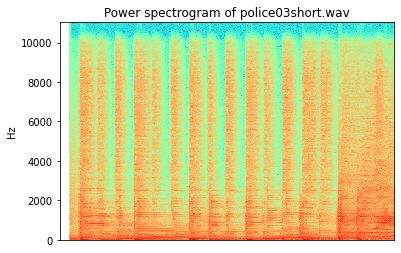

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]


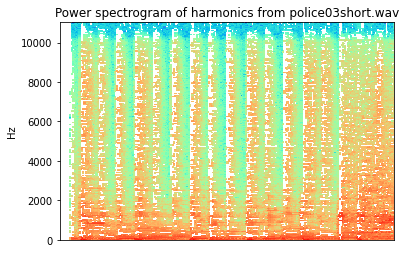

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in log10


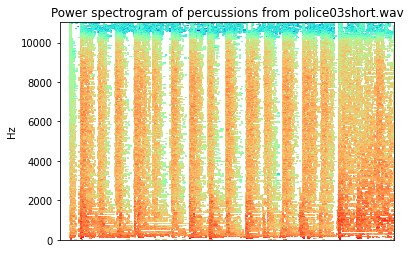

Gamma: 0.3
Aplha: 0.3
SNR of harmonic component: 12.470238208770752
SNR of percussive component: 0.34626904875040054
SNR: 140.34231185913086

Accuracy: 99.99975545488269


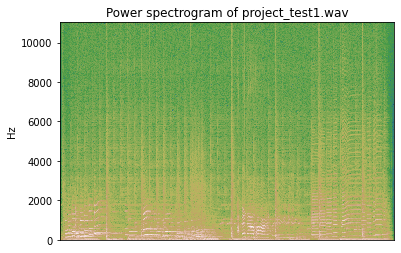

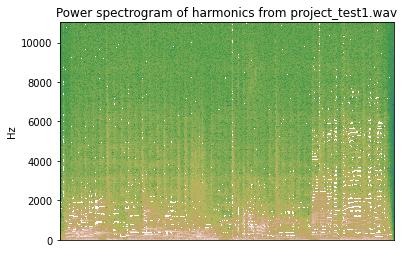

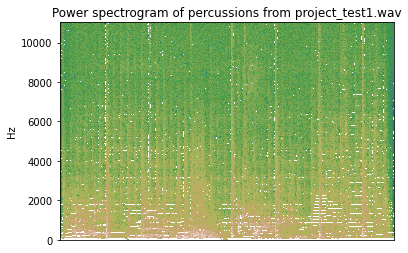

Gamma: 0.5
Aplha: 0.3
SNR of harmonic component: 8.087164759635925
SNR of percussive component: 1.0695592314004898
SNR: 142.7956199645996

Accuracy: 99.99989478945963


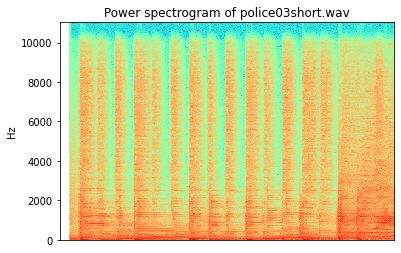

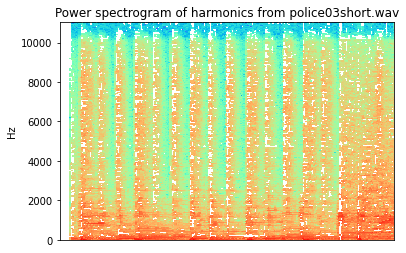

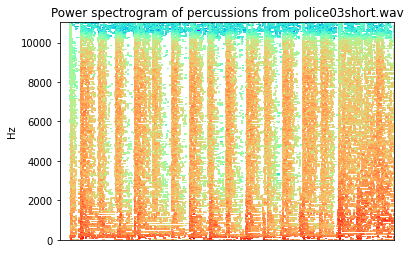

Gamma: 0.5
Aplha: 0.3
SNR of harmonic component: 13.08886170387268
SNR of percussive component: 0.3076748363673687
SNR: 142.69004821777344

Accuracy: 99.99975950984208


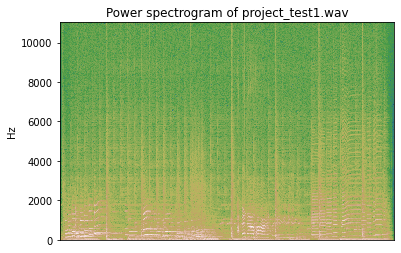

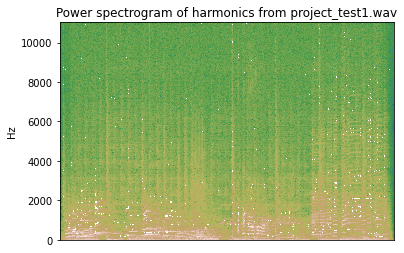

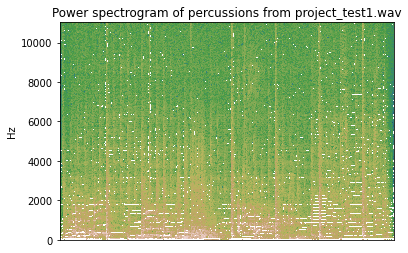

Gamma: 0.7
Aplha: 0.3
SNR of harmonic component: 7.958472371101379
SNR of percussive component: 1.1698612570762634
SNR: 142.39505767822266

Accuracy: 99.9998939372972


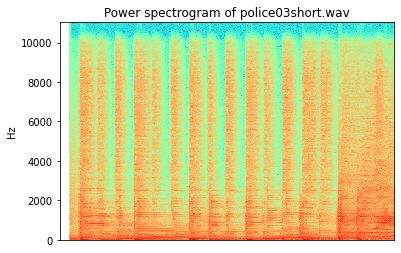

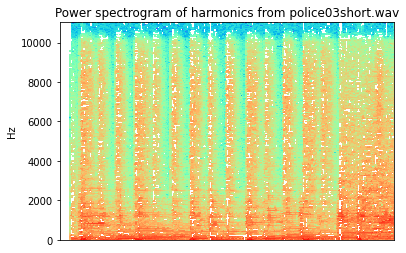

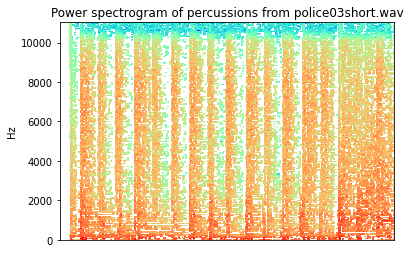

Gamma: 0.7
Aplha: 0.3
SNR of harmonic component: 12.875194549560547
SNR of percussive component: 0.32909587025642395
SNR: 142.23268508911133

Accuracy: 99.99971706135966


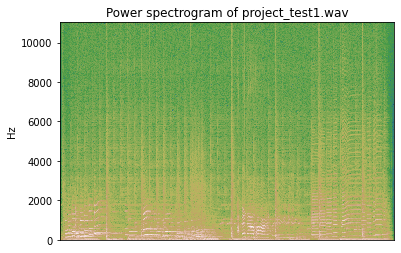

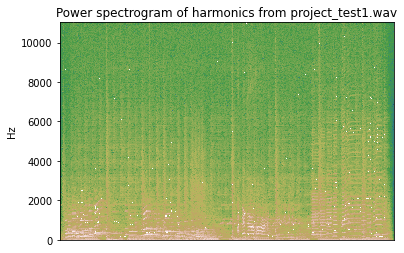

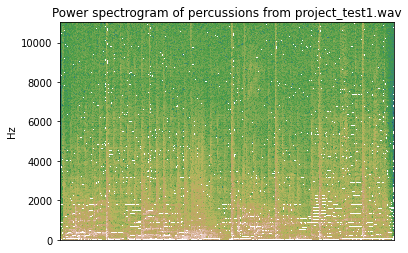

Gamma: 0.9
Aplha: 0.3
SNR of harmonic component: 7.73284375667572
SNR of percussive component: 1.2559391558170319
SNR: 140.04620552062988

Accuracy: 99.9999289143716


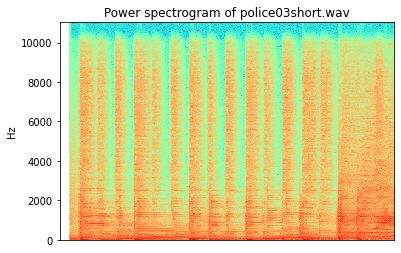

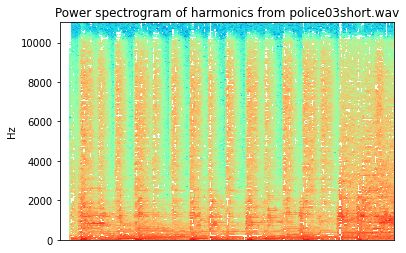

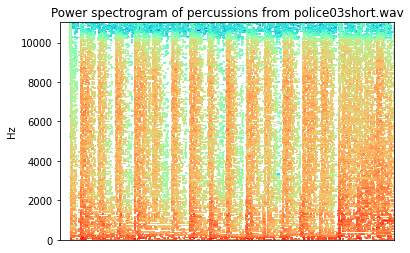

Gamma: 0.9
Aplha: 0.3
SNR of harmonic component: 12.451103925704956
SNR of percussive component: 0.3878409042954445
SNR: 139.34850692749023

Accuracy: 99.99977212257818


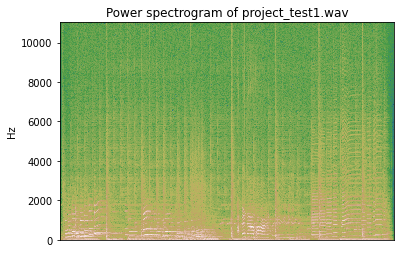

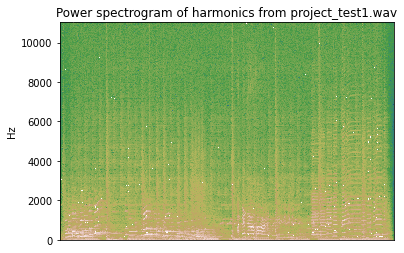

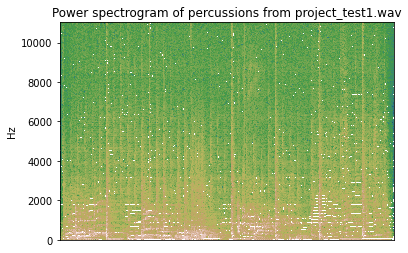

In [ ]:
EpochNo = 50
winlength = 1024
alpha = 0.3

gammaArray=[0.3,0.5,0.7,0.9]
for gamma in gammaArray:
#gamma = 0.3
    fileNames=['police03short.wav','project_test1.wav']

    for file in fileNames:
        audio, fs=lb.load(file, sr=None)

        F = lb.stft(audio, n_fft=winlength, hop_length=int(winlength/2), win_length=winlength, window='hann', center=True, dtype=None, pad_mode='reflect')
        hh = F.shape[0] #h
        ii = F.shape[1]  #i
        W = np.power(np.abs(F),2*gamma)
        H = 0.5*W
        P = 0.5*W
        H,P=HnP_Cal(hh,ii,W,H,P)
        ht,pt=ISTFT_cal()
        e,SNRh,SNRp,SNR,y,ht,pt=SNR_cal(ht,pt)
        if (gamma==0.3 and alpha==0.3):
            if file=='police03short.wav':
                mainHtpolice03short=ht
                mainPtpolice03short=pt
                mainYpolice03short=y
            else:
                mainHtproject_test1=ht
                mainPtproject_test1=pt
                mainYproject_test1=y
        evaluation_params(e,SNRh,SNRp,SNR)
        spectograms_plots(file)

# Evaluation
On two audio samples provided by the course: police03short.wav and project test1.wav, three different assessment metrics were used: signal-to-noise ratio, spectrogram, and auditory evaluation.
We have calculated accuracy by taking the ratio of the sum of error array and the original audio signal array.



# Auditory evaluation 

# police03short.wav

In [ ]:
Audio('police03short.wav',rate=fs)

In [ ]:
Audio(mainYpolice03short,rate=fs)

In [ ]:
Audio(mainHtpolice03short,rate=fs)

In [ ]:
Audio(mainPtpolice03short,rate=fs)

# project_test1.wav

In [ ]:
Audio('project_test1.wav',rate=fs)

In [ ]:
Audio(mainYproject_test1,rate=fs)

In [ ]:
Audio(mainHtproject_test1,rate=fs)

In [ ]:
Audio(mainPtproject_test1,rate=fs)

# Signal-to-noise ratio

The signal-to-noise ratio is defined as

                                〖SNR〗=10log_10 ((∑_t〖s(t)〗^2 )/(∑_t〖e(t)〗^2 )

where s(t) represents the original signal and e(t) represents the original signal less the separated signal A ratio larger than one (greater than 0 dB) shows that there is more signal than noise. To investigate the impact of the range compression coefficient and the number of search iterations on the quality, signal-to-noise ratios were determined. The observations on police03short.wav are depicted in the two charts below.

From these plots we can see that setting the range compression value to 1 (the highest possible value) will yield the highest SNR, minimizing the effect of noise. Changing the number of iterations, however, does not significantly affect the SNR. Similar observations are also observed in project_test1.wav. Therefore, we recommend setting γ to 1 and the number of iterations to at least 20 but increasing it won’t yield noticeable improvement.


# What kind of audio material is the algorithm suitable for and why?

The method is appropriate for any audio that has percussion sounds, however it performs best with instrumental samples.
This method works the best on separation of pitched instruments and drums together.

# How should the separation quality be measured and assessed?

When we compare these spectrograms, we can clearly see the harmonics (horizontal lines) and the percussions (vertical lines) (straight, vertical lines).
We listened to the sounds and compared them to the original sample for auditory evaluation.
In addition, when we tried to discriminate between the original and rebuilt samples, we discovered that the reconstructed one is exactly matched. 
This means that the algorithm did an excellent job on this audio sample.

# References

[1] Nobutaka Dno, Kenichi Miyamoto, Jonathan Le Roux, Hirokazu Kameoka, and Shigeki Sagayama “Separation of a monaural audio signal into harmonic/percussive components by complementary diffusion on spectrogram”. Proc. EUSIPCO, Aug 2008.

[2] Wikipedia: Signal-to-noise ratio. Available at: https://en.wikipedia.org/wiki/Signal-to-noise_ratio
